In [1]:
%load_ext autoreload

%autoreload 2

In [1]:
# Force CPU:
import os
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"] = ""

In [2]:
import math
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow, imread, imsave, figure
import pandas as pd
import numpy as np
import os
import sys
from skimage.color import rgb2gray
from skimage.transform import rescale, resize


#Keras:
import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import LearningRateScheduler
from keras.optimizers import SGD
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, LearningRateScheduler

#Custom Functions:
ROOT_DIR = os.path.abspath("../")
sys.path.append(ROOT_DIR)

from imports.utils.log_progress import log_progress
from imports.utils.visualization import Visualize
from imports.utils.enums import DATA_BASE_PATH, SHAPE
from imports.models.u_net import get_unet
from imports.utils.utils import rle_encode, rle_decode

DATA_IMAGE_PATH = DATA_BASE_PATH + '/Images'
DATA_MASK_PATH = DATA_BASE_PATH + '/Masks'

/opt/conda/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [3]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
from keras import backend as K
K.tensorflow_backend._get_available_gpus()

[]

### load existing Model:

In [15]:
from imports.models.losses import bce_dice_loss, dice_coeff
from keras.models import load_model, model_from_json

import keras.losses
keras.losses.custom_loss = bce_dice_loss

model = load_model('../saved_models/unet/hand_val_dice_coeff_0.76532_adadelta_default.h5', custom_objects={'bce_dice_loss': bce_dice_loss,'dice_coeff':dice_coeff})
#model_circle = load_model('../saved_models/unet/circle_val_dice_coeff_0.60796_adadelta_default.h5', custom_objects={'bce_dice_loss': bce_dice_loss,'dice_coeff':dice_coeff})

# 2. Visualize

### 2.1 Show Samples of trained Model:

In [6]:
train_df = pd.read_pickle(DATA_BASE_PATH+'/train_df')
val_df = pd.read_pickle(DATA_BASE_PATH+'/val_df')
test_df = pd.read_pickle(DATA_BASE_PATH+'/test_df')

print("Number of training Samples:", len(train_df))
print("Number of validation Samples:", len(val_df))
print("Number of test Samples:", len(test_df))

Number of training Samples: 354
Number of validation Samples: 102
Number of test Samples: 51


In [25]:
val_df.sample(10)

,image_path,mask_path,mask_cirlce_path,name,dataset,mask_rle,mask_circle_rle,roots,splines
22,../data/00_train_all/images/,../data/00_train_all/masks/,../data/00_train_all/masks_autogen/,img_1147.png,None,1868 27 1923 85 2015 35 2208 34 2264 41 3403 2...,940 1491 5548 1491 10156 1491 14761 1497 19369...,"[[1076.9054804517812, 471.1191272727273], [465...","[[[980.4395204170285, 546.3003176064442], [935..."
95,../data/00_train_all/images/,../data/00_train_all/masks/,../data/00_train_all/masks_autogen/,img_1209.png,None,114344 8 115875 17 117410 19 118944 23 120479 ...,1209304 81 1213885 135 1218475 171 1223068 201...,"[[682.7932357949609, 415.2412501726122]]","[[[684.805293483927, 84.24624165707709], [674...."
97,../data/00_train_all/images/,../data/00_train_all/masks/,../data/00_train_all/masks_autogen/,img_1180.png,None,228129 3 229661 7 231196 8 232732 8 234267 9 2...,1020694 81 1025275 135 1029865 171 1034458 201...,"[[788.790580712424, 374.70180897583424], [522....","[[[661.8692948740226, 290.6752736478711], [737..."
39,../data/00_train_all/images/,../data/00_train_all/masks/,../data/00_train_all/masks_autogen/,img_1009.png,None,186985 6 188518 11 190053 13 191588 17 193124 ...,1353217 81 1357798 135 1362388 171 1366981 201...,"[[1037.1924292682927, 446.9210541632983]]","[[[763.8062829268292, 494.7698755052547], [801..."
90,../data/00_train_all/images/,../data/00_train_all/masks/,../data/00_train_all/masks_autogen/,img_1199.png,None,1843 25 3378 26 4911 30 6445 32 7980 34 9515 3...,646111 81 650692 135 655282 171 659875 201 664...,"[[945.3939878366638, 421.31923222094366], [926...","[[[821.1958658557775, 385.62720552359025], [73..."
70,../data/00_train_all/images/,../data/00_train_all/masks/,../data/00_train_all/masks_autogen/,img_1450.png,None,1584 60 3119 62 4656 62 6192 63 7728 65 9265 6...,1642387 81 1646968 135 1651558 171 1656151 201...,"[[659.5148066029539, 509.05417353279626], [288...","[[[762.3143534317983, 541.3358913693901], [887..."
67,../data/00_train_all/images/,../data/00_train_all/masks/,../data/00_train_all/masks_autogen/,img_1461.png,None,449261 2 450792 12 452227 3 452231 2 452234 3 ...,463024 81 467605 135 472195 171 476788 201 481...,"[[754.4799082536923, 253.54923452243958], [786...","[[[700.381748045178, 787.0602752589183], [758...."
65,../data/00_train_all/images/,../data/00_train_all/masks/,../data/00_train_all/masks_autogen/,img_1198.png,None,543008 1 544540 9 546075 11 547609 15 549144 1...,1674919 81 1679500 135 1684090 171 1688683 201...,"[[751.229887054735, 516.2499535097813]]","[[[947.9063909643788, 591.3843037974683], [853..."
37,../data/00_train_all/images/,../data/00_train_all/masks/,../data/00_train_all/masks_autogen/,img_1108.png,None,476432 4 477963 14 477984 10 479497 37 481032 ...,1148506 81 1153087 135 1157677 171 1162270 201...,"[[384.4960750651607, 402.7613827387802]]","[[[256.9503360556038, 326.6401215189873], [302..."
61,../data/00_train_all/images/,../data/00_train_all/masks/,../data/00_train_all/masks_autogen/,img_1229.png,None,839 50 970 9 2375 51 2504 12 3910 54 4039 15 4...,2584 321 7183 339 11785 351 16387 363 20986 38...,"[[515.6009925282364, 361.7244649021864], [843....","[[[49.967312180712426, 551.1710637514384], [11..."


In [33]:
vis_params = {'df':val_df,
              'model':model}

visualize = Visualize(**vis_params)

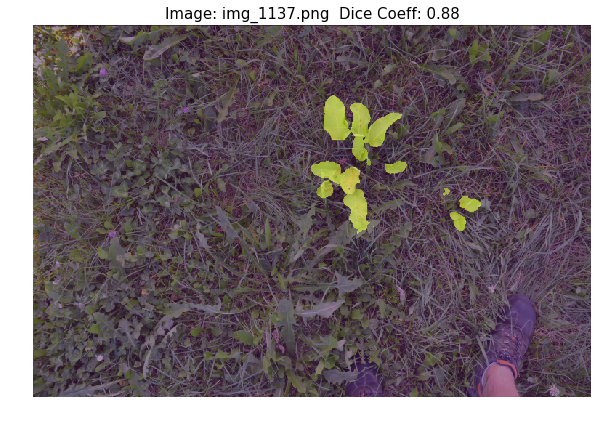

In [35]:
visualize.show_single(index='1137',mode='image_prediction')

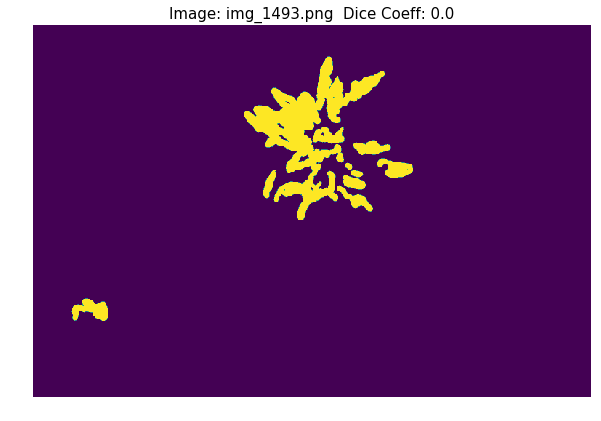

In [36]:
visualize.show_single(index='random',mode='mask')

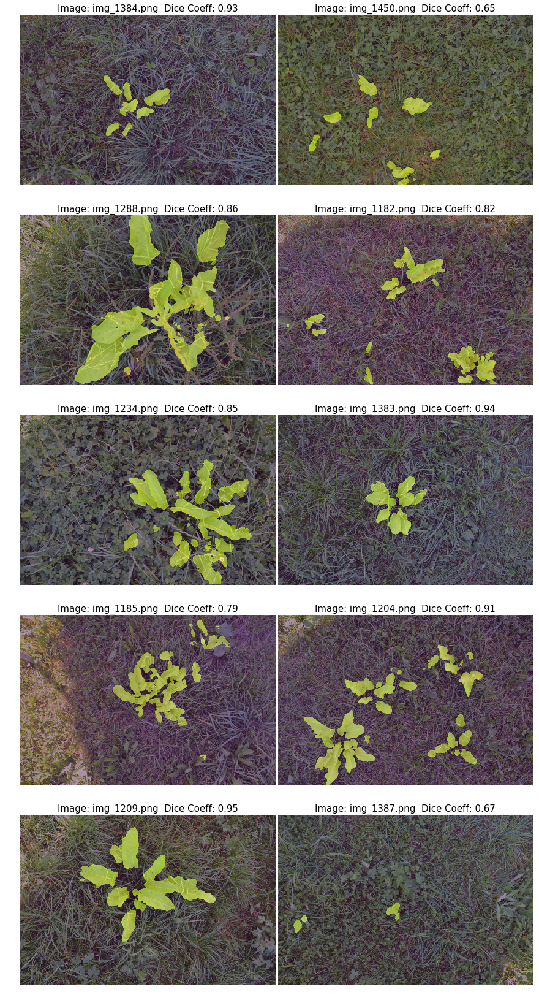

In [21]:
visualize.show_matrix(index='random',mode='image_prediction',rows=5)

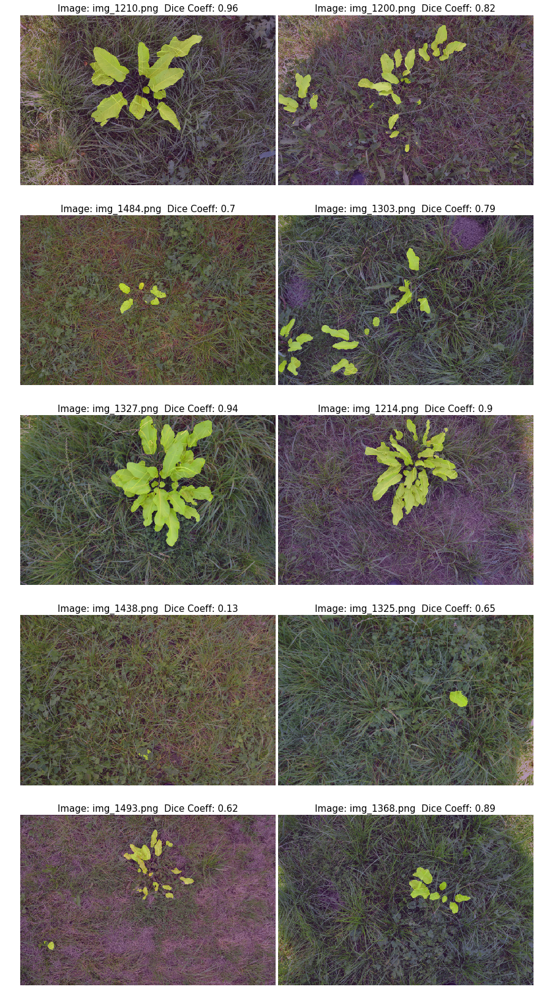

In [12]:
visualize.show_matrix(index='random',mode='image_prediction',rows=5)

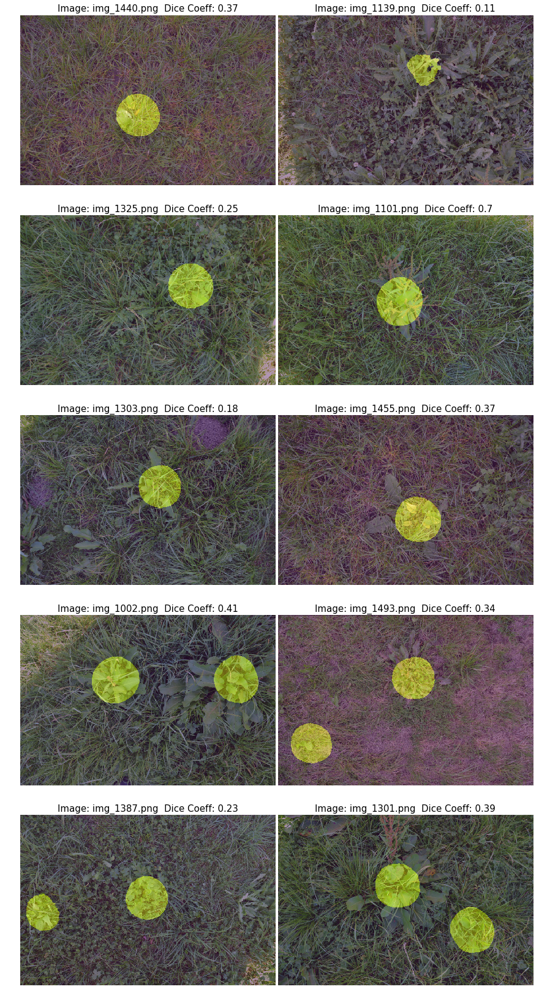

In [18]:
visualize.show_matrix(index='random',mode='image_prediction',rows=5)

### Segment the predicted Masks using watershed-segmentation:

In [18]:
im = visualize.get_image(1255)
pred = visualize.get_prediction(1255)

Text(0.5,1,'Separated objects')

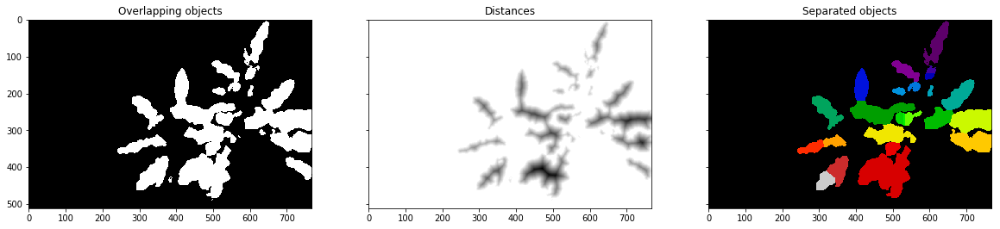

In [19]:
# http://scikit-image.org/docs/dev/auto_examples/segmentation/plot_watershed.html

def watershed_segmentation(prediction_image,threshold=0.90,footprint_size=(40,40)):
    from scipy import ndimage as ndi
    from skimage.morphology import watershed
    from skimage.feature import peak_local_max
    from skimage.draw import circle
    circle_img = np.zeros(footprint_size, dtype=np.uint8)
    rr, cc = circle(footprint_size[0]/2, footprint_size[1]/2,min(footprint_size)/2-2)
    circle_img[rr, cc] = 1
    
    # Now we want to separate the two objects in image
    # Generate the markers as local maxima of the distance to the background
    pred_logical = prediction_image>threshold
    distance = ndi.distance_transform_edt(pred_logical)
    local_maxi = peak_local_max(distance, indices=False, footprint=circle_img, labels=pred_logical)
    markers = ndi.label(local_maxi)[0]
    labels = watershed(-distance, markers, mask=pred_logical)
    
    return distance, labels

distance, labels = watershed_segmentation(pred,footprint_size=(60,60))

fig, axes = plt.subplots(ncols=3, figsize=(20, 20), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(pred, cmap=plt.cm.gray, interpolation='nearest')
ax[0].set_title('Overlapping objects')
ax[1].imshow(-distance, cmap=plt.cm.gray, interpolation='nearest')
ax[1].set_title('Distances')
ax[2].imshow(labels, cmap=plt.cm.nipy_spectral, interpolation='nearest')
ax[2].set_title('Separated objects')

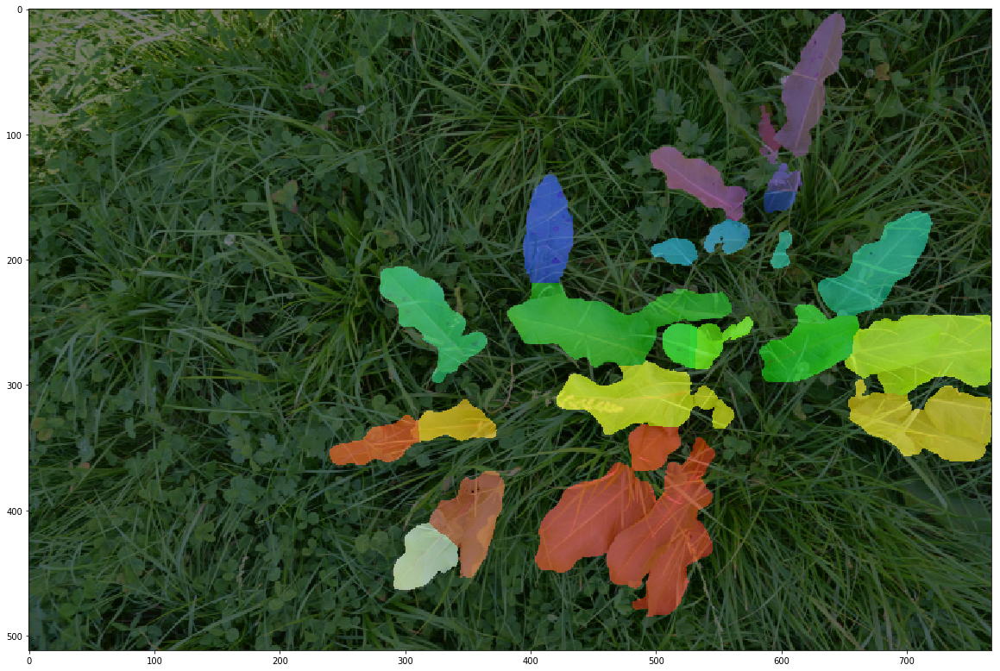

In [20]:
plt.figure(figsize=(20,20))
imshow(labels, cmap=plt.cm.nipy_spectral, interpolation='nearest')
imshow(im,alpha=0.5)

In [10]:
vis_params = {'df':val_df,
              'model':model}

visualize1 = Visualize(**vis_params)

vis_params = {'df':val_df,
              'model':model2}

visualize2 = Visualize(**vis_params)

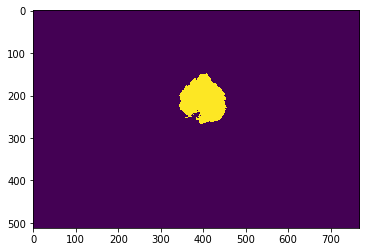

In [11]:
#1493
#1366
index = 1303
pred = visualize1.get_prediction(index=index)
pred2 = visualize2.get_prediction(index=index)
img = visualize1.get_image(index=index)
imshow(pred)

In [12]:
import skimage.measure
mask = pred > 0.5
labels = skimage.measure.label(mask)
print(labels.shape, labels.dtype)
print("Unique values in labels:", np.unique(labels))

(512, 768) int64
Unique values in labels: [0 1]


In [13]:
import ipywidgets as widgets
@widgets.interact(label = list(np.unique(labels)))
def f(label):
    print(f"The connected component with label {label} contains {np.sum(labels == label)} pixels")
    plt.imshow(labels == label)

interactive(children=(Dropdown(description='label', options=(0, 1), value=0), Output()), _dom_classes=('widget…

In [14]:
regions = skimage.measure.regionprops(labels)
large_regions = [r for r in regions if r.area > 2000]
print(f"There are {len(large_regions)} large regions")
regions[0]

There are 1 large regions


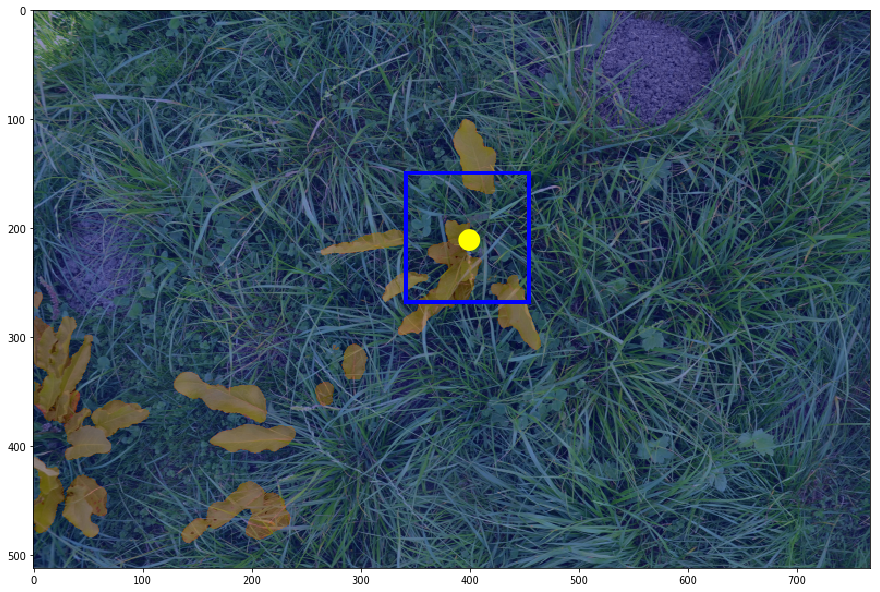

In [15]:
import matplotlib.patches as patches
fig, ax = plt.subplots(figsize=(15,15))
ax.imshow(img, cmap="gray")
ax.imshow(pred2,cmap='jet',alpha=0.4)
rects = []
circs = []
for r in large_regions:
    (min_row, min_col, max_row, max_col) = r.bbox
    (c_row,c_col) = r.centroid
    width = max_col - min_col
    height = max_row - min_row
    rect = patches.Rectangle((min_col,min_row),width,height,
                            linewidth=4,edgecolor='b',facecolor='None')
    circ = patches.Circle((c_col,c_row),10,facecolor='yellow')
    ax.add_patch(rect)
    ax.add_patch(circ)
    rects.append(rect)
    circs.append(circ)

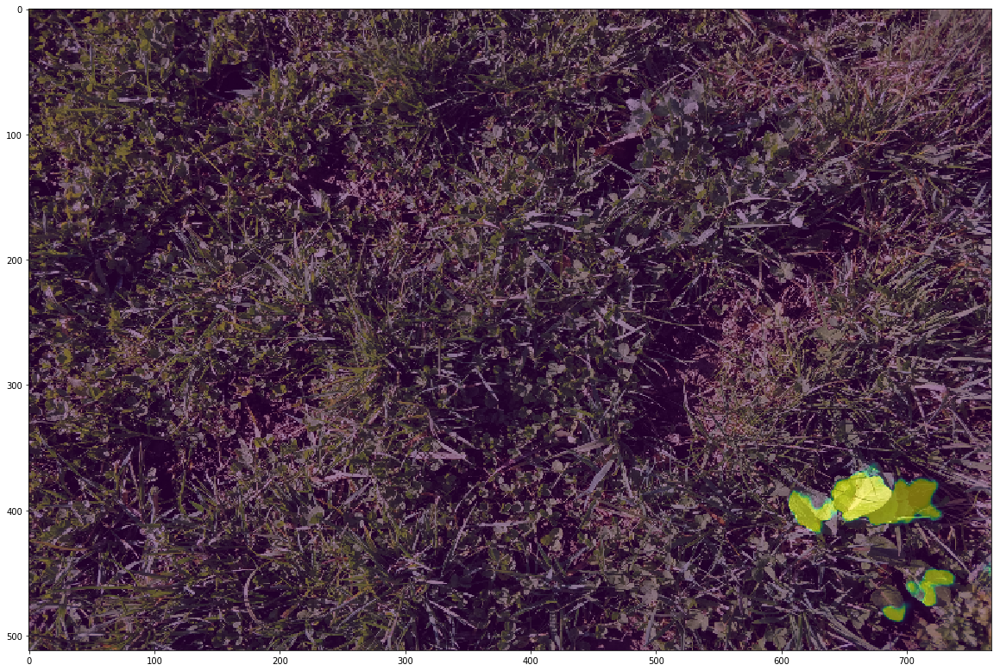

In [74]:
testim = imread(DATA_BASE_PATH+'/tmp/a.jpg')
testim = resize(testim,(SHAPE[0],SHAPE[1])).reshape(*SHAPE,3)
testpred = model2.predict(testim.reshape(1,*SHAPE,3))
plt.figure(figsize=(20,20))
imshow(testim)
imshow(testpred.reshape(*SHAPE),alpha=0.5)

#### Eigenvector Test:

In [37]:
#Eigenvector Test:
tmp = pred>0.9
y, x = np.nonzero(tmp)
x = x - np.mean(x)
y = y - np.mean(y)
coords = np.vstack([x, y])
cov = np.cov(coords)
evals, evecs = np.linalg.eig(cov)
sort_indices = np.argsort(evals)[::-1]
x_v1, y_v1 = evecs[:, sort_indices[0]]  # Eigenvector with largest eigenvalue
x_v2, y_v2 = evecs[:, sort_indices[1]]


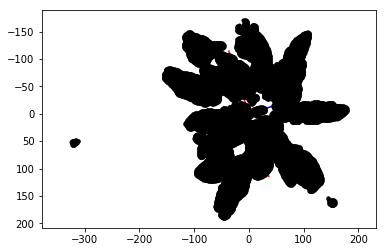

In [38]:
scale = 60
plt.plot([x_v1*-scale*2, x_v1*scale*2],
         [y_v1*-scale*2, y_v1*scale*2], color='red')
plt.plot([x_v2*-scale, x_v2*scale],
         [y_v2*-scale, y_v2*scale], color='blue')
plt.plot(x, y, 'k.')
plt.axis('equal')
plt.gca().invert_yaxis()  # Match the image system with origin at top left
plt.show()